<a href="https://colab.research.google.com/github/hussain0048/Computer-Vision-/blob/main/Introduction_to_Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Chapter 1 - Introduction to Computer Vision**

**Table of Content**
1. How to load an image using the cv2 library?
2. True nature of an image
3. How to convert an image from one colorspace to another?
4. How to compare RGB and BGR channels?
5. How to plot an image by creating an array?
6. How to compare different channels of a single colorspace?

##**1-Load the image and change the colorspace**

In [1]:
#Imports
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

When we load the image using the cv2 library, the image is by default loaded in BGR colorspace. For our use, we will convert it into RGB and GRAY colorspace using the following code

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
print(os.listdir('/content/drive/MyDrive/Computer Vision/'))

['Introduction_to_Computer_Vision.ipynb', 'Soumyaface.jpg', 'sky.jpg', 'fruit.png', 'bicycle.png', 'dolphin.png']


In [4]:
# load the image
img = cv2.imread('/content/drive/MyDrive/Computer Vision/Soumyaface.jpg')
# Change the image into desired colorspace
grayscale = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

## **1.2-Plot the image in all the colorspaces using matplotlib subplots**

In [5]:
f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(30,8))
ax1.set_title('BGR')
ax1.imshow(img)
ax2.set_title('RGB')
ax2.imshow(rgb)
ax3.set_title('GRAY')
ax3.imshow(grayscale,cmap='gray')

Output hidden; open in https://colab.research.google.com to view.

## **1.3-shape of the image**

In [6]:
print(img.shape)

(2414, 2461, 3)


In [7]:
print(img[:1,:1])

[[[ 76 149 229]]]


2414 X 2461 is the dimension of the image I used, where 2414 is the height, and 2461 is the width of the image. The 3 stands for each value of that pixel for a single color. In the latter code we see BGR values of first pixel in image (OpenCV uses BGR by default), 76 represents the intensity of the blue color, 149 for the green color, and 229 for the red color, since img was by default in BGR colorspace.

##**1.4-Show pixel of image on screen**

In [8]:
!pip install Pillow


In [9]:
import PIL.Image

In [10]:
# module, which is a Python library for working with images. Then, it will define a function called
image = PIL.Image.open('/content/drive/MyDrive/Computer Vision/Soumyaface.jpg')
background = PIL.Image.open('/content/drive/MyDrive/Computer Vision/sky.jpg')

In [11]:
pixel = image.getpixel((76, 70))

In [12]:
print(pixel)

(195, 125, 56)


## **1.5-Crop Image**

(2414, 2461, 3)


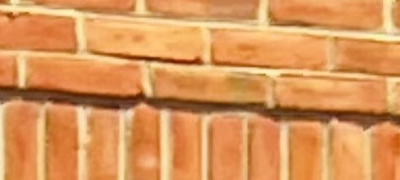

In [13]:
# Import packages
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
img = cv.imread('/content/drive/MyDrive/Computer Vision/Soumyaface.jpg')
print(img.shape) # Print image shape

# Cropping an image
cropped_image = img[120:300, 100:500]
cv2_imshow(cropped_image)




## **1-5-know the value of any pixel in grayscale image**

In [14]:
x,y = 1000,1000
at_1000 = grayscale[x,y]
print(at_1000)

92


In [15]:
grayscale[1000,1000,]

92

## **1-5-Generate various images by creating an array**

Let us generate the alphabet S using a numpy array.



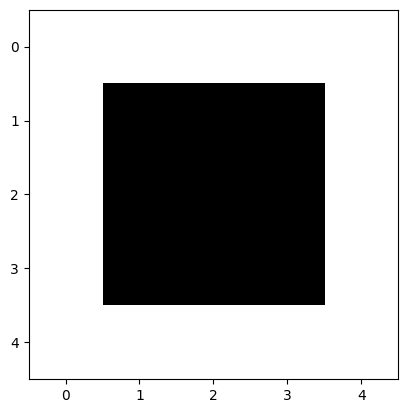

In [16]:
Letter_O = np.array([[255, 255, 255, 255, 255],
                     [255, 0, 0, 0, 255],
                     [255, 0, 0, 0, 255],
                     [255, 0, 0, 0, 255],
                     [255, 255, 255, 255, 255]])
plt.imshow(Letter_O,cmap='gray')

## **1-6-Plot Each Color Channel from RGB colorspace**

In [17]:
# Store values of each channel in different array
r = rgb[:,:,0]
g = rgb[:,:,1]
b = rgb[:,:,2]

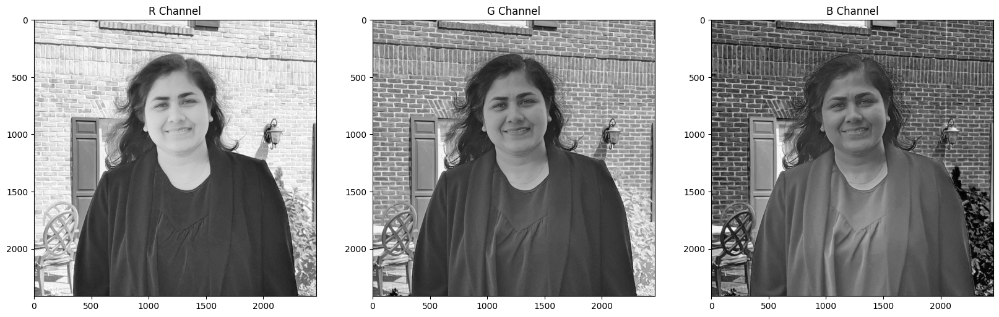

In [18]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,10))

ax1.set_title('R Channel')
ax1.imshow(r, cmap='gray')

ax2.set_title('G Channel')
ax2.imshow(g,cmap='gray')

ax3.set_title('B Channel')
ax3.imshow(b,cmap='gray')

# **Chapter 2:Background Replacement Of An Image**

**Table of Content**

1. Creating a mask for an image
2. Removing the existing background of the image
3. Replacing the background with the image of our choice

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [20]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Soumyaface.jpg')
background = cv2.imread('/content/drive/MyDrive/Computer Vision/sky.jpg')
print('Type:', type(image),' dimensions:', image.shape)
print('Type:', type(background),' dimensions:', background.shape)

Type: <class 'numpy.ndarray'>  dimensions: (2414, 2461, 3)
Type: <class 'numpy.ndarray'>  dimensions: (4032, 3024, 3)


In [21]:
cv2_imshow(background)

Output hidden; open in https://colab.research.google.com to view.

## **2.1. Function to change the colorspace**



In [22]:
# Function to convert colorspace from BGR to RGB
def BGR2RGB(BGR_image):
    return cv2.cvtColor(BGR_image,cv2.COLOR_BGR2RGB)

image = BGR2RGB(image)
background = BGR2RGB(background)

## **2.2-. Create a copy and display the image**



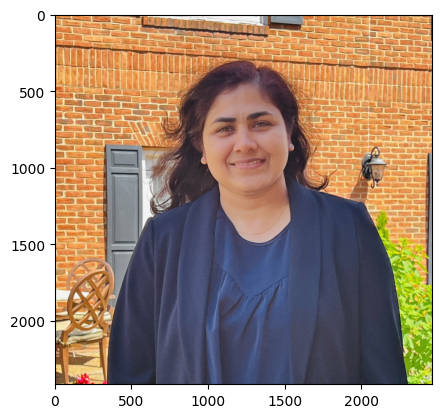

In [23]:
image_copy = np.copy(image)
plt.imshow(image_copy)

## **2.3. Declare Section Boundaries and create a mask**



The color boundaries defined by lower_range and upper_range specify the range of pixel values that should be included in the mask. To understand how these values work, let's break down the range [0, 230, 0] to [100, 255, 100]:

lower_range = np.array([0, 230, 0])
This means the lowest value for the Blue channel is 0, for the Green channel is 230, and for the Red channel is 0.
upper_range = np.array([100, 255, 100])
This means the highest value for the Blue channel is 100, for the Green channel is 255, and for the Red channel is 100.
In the context of a BGR image (as used by OpenCV), this range is selecting pixels that have a high green value (between 230 and 255) and relatively low blue and red values (between 0 and 100). This is how it effectively masks green regions in the image.

Each image can be represented in form of function. Where lower and upper range can be set using 3 values point RGB values.

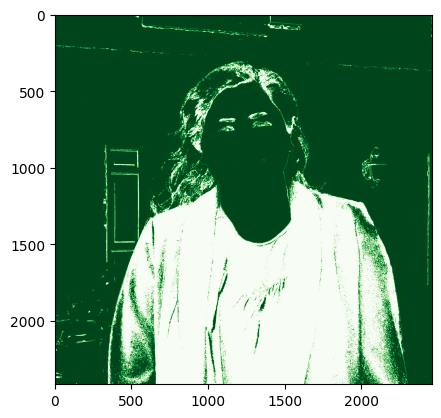

In [24]:
# # Next step is to declare the boundaries
# lower_range = np.array([0,230,0])
# upper_range = np.array([100,255,100])
# # Creating a mask
# masked = cv2.inRange(image,lower_range,upper_range)
# plt.imshow(masked,cmap='Blues_r')


lower_range = np.array([25,52,10])   # BGR
upper_range = np.array([102, 100, 255])  # BGR
# Creating a mask
masked = cv2.inRange(image,lower_range,upper_range)
plt.imshow(masked,cmap='Greens_r')



## **2.4-Using the mask on the copy of an original image**

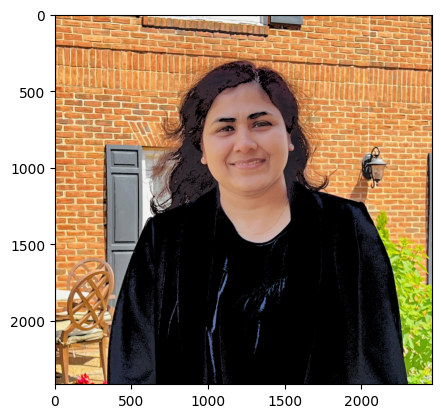

In [25]:
# storing original image in new variable
masked_image = np.copy(image)
# Step - 1: Region where mask value is not zero i.e not black (mask != 0) is to be turn black in newly stored original image
masked_image[masked!=0] = [0,0,0]
plt.imshow(masked_image,cmap='gray')

# plt.imshow(image)

## **2.5-. Using a mask on the background**

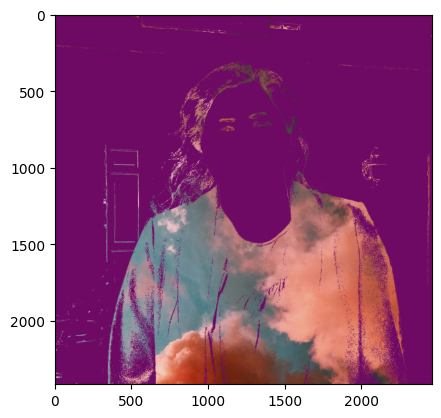

In [26]:
# Crop the image so that it has same dimenstions as of original image
cropped_bg = background[:image.shape[0],:image.shape[1]]
# # Now Lets get to the background we need to be replace it with
# Step 2: Remove the region of car from background image
cropped_bg[masked==0] = [110,10,100]
plt.imshow(cropped_bg)



## 2.6-8. **Final Output**

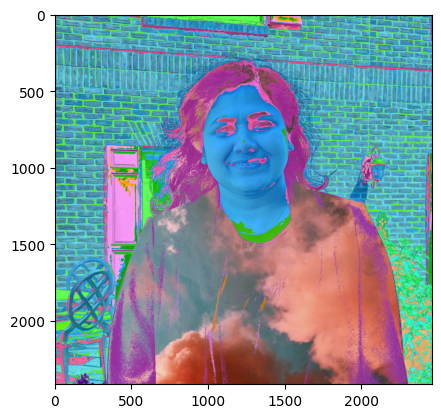

In [27]:
final = cropped_bg+masked_image
plt.imshow(final)


## 2**.7. Plotting Function**

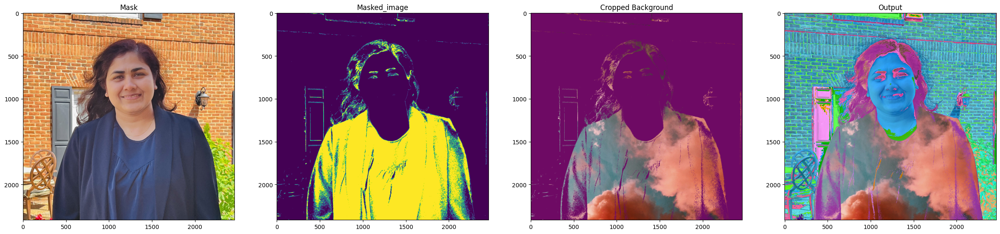

In [28]:
def Plotting(mask,masked_image,cropped_bg,output_image):
    f,(ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(30,10))
    ax1.set_title('Mask')
    ax1.imshow(mask)
    ax2.set_title('Masked_image')
    ax2.imshow(masked_image)
    ax3.set_title('Cropped Background')
    ax3.imshow(cropped_bg)
    ax4.set_title('Output')
    ax4.imshow(output_image)

Plotting(image,masked,cropped_bg,final)

## **2.8-Put it all together**

In [29]:
# Combining Everything in one function
def BG_replacement(image,background,lower_range,upper_range):
#     Step1 - Creating a mask
    mask = cv2.inRange(image,lower_range,upper_range)
#     Step2 - Using mask on copy of original image
    masked_image = np.copy(image)
    masked_image[mask!=0] = [0,0,0]
#     Step3 - Using mask on background
    cropped_bg = background[:image.shape[0],:image.shape[1]]
    cropped_bg[mask==0] = [0,0,0]
#     Creating output image by adding images obtained in step2 and step
    output_image = masked_bulb + cropped_bg
#     Final Plot
    Plotting(mask,masked_image,cropped_bg,output_image)

In [30]:
BG_replacement

<function __main__.BG_replacement(image, background, lower_range, upper_range)>



```
# This is formatted as code
```

Chaper 2: Image as function

# **Chapter 2 image as function**

uint8


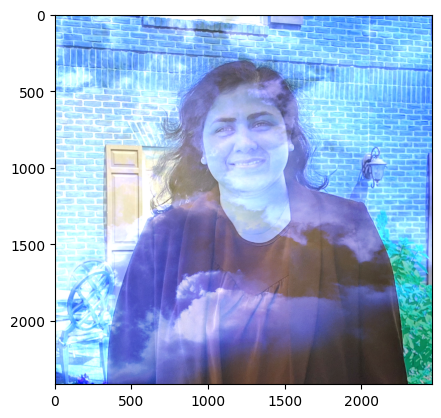

In [31]:
from matplotlib import pyplot as plt
import cv2
import numpy as np


d = cv2.imread('/content/drive/MyDrive/Computer Vision/Soumyaface.jpg')
b = cv2.imread('/content/drive/MyDrive/Computer Vision/sky.jpg')

# Resize images to the same dimensions
b_resized = cv2.resize(b, (d.shape[1], d.shape[0]))

# db = b+d            # Raw addition amplifies the intensity
# db2 = (b/2)+(d/2)   # So we divide the intesities

# Perform the addition
db = cv2.add(d, b_resized)           # Use cv2.add for pixel-wise addition with saturation
db2 = (d / 2) + (b_resized / 2)      # Average method

plt.imshow((db2 * 255).astype(np.uint8))
# Pretty fuzzy eh?

# Blending ( aka Alpha Blending is a weighted addition)
def myblend(imA,imB,alpha):
    rval = (alpha*imA)+((1-alpha)*imB)
    return rval

#x = myblend(b,d,0.999)
x = cv2.addWeighted(b_resized,0.8,d,0.8,0)
print(x.dtype)
plt.imshow(x)

## **Color Planes**

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [33]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
img = cv2.imread('/content/drive/MyDrive/Computer Vision/fruit.png')

In [35]:
print(img.shape)

(347, 697, 3)


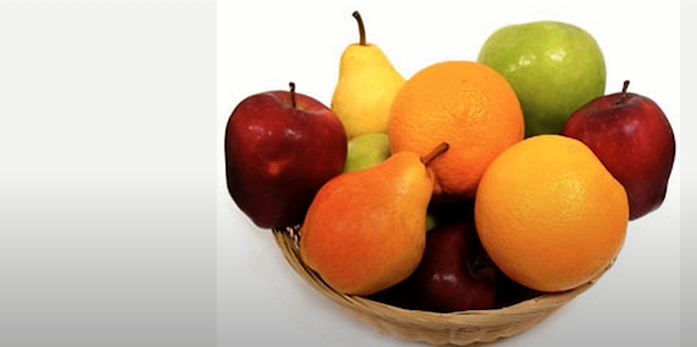

In [36]:

cv2_imshow(img)

**Example 1**

**Select the red color channelPlan**,

The line cropped_image = img[:,:,1] extracts a specific color channel from the image. In OpenCV, images are typically stored in BGR format, where:

img[:,:,0] refers to the Blue channel,
img[:,:,1] refers to the Green channel,
img[:,:,2] refers to the Red channel.

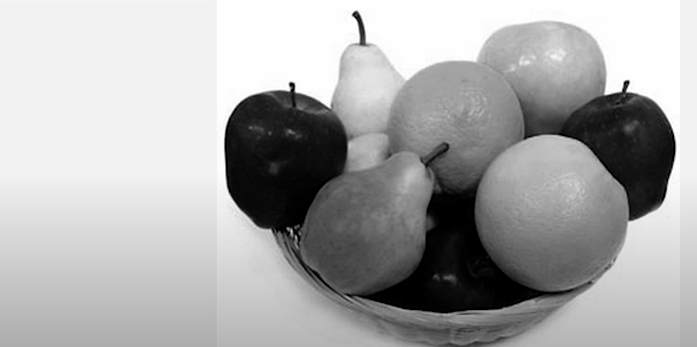

In [37]:
cropped_image = img[:,:,1]
cv2_imshow(cropped_image)

**plotting the values from a row of the image**

 cropped_image is a 2D array representing the Green channel of the image, this command plots the pixel values along the rows from index 10 to 150.

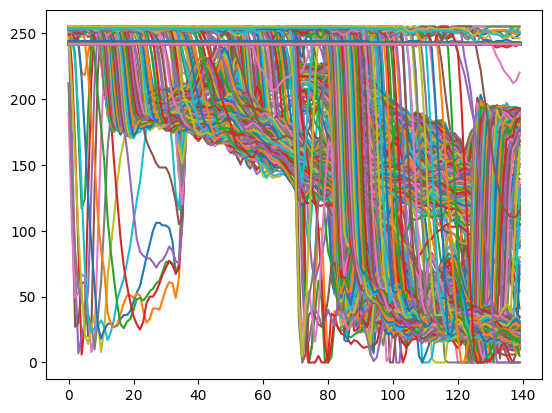

In [38]:
import matplotlib.pyplot as plt

plt.plot(cropped_image[10:150])  # select rows from index 10 to 150, resulting in a 2D array containing pixel values from these rows
plt.show()

**Example 2**

Blue Plane


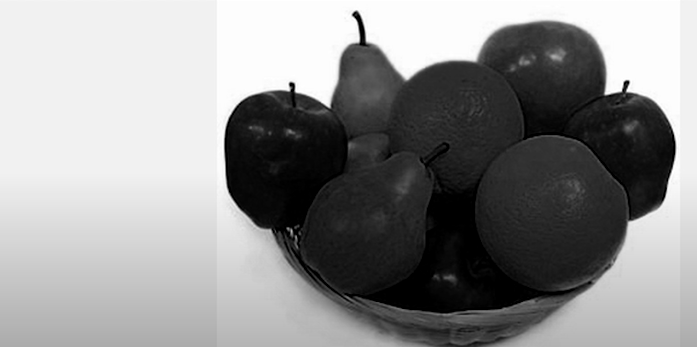

Green Plane


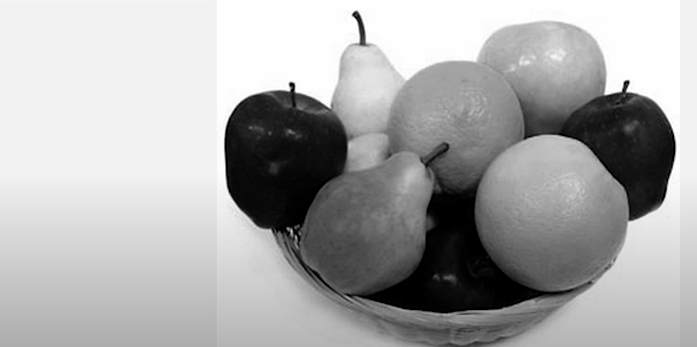

Red Plane


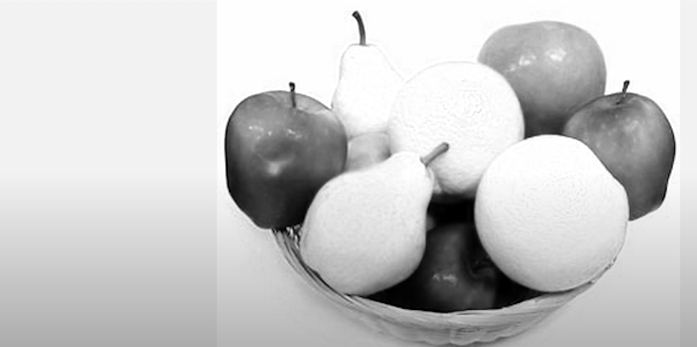

In [39]:
# Load the image

# Split the image into color planes
b, g, r = cv2.split(img)
# Display the color planes
print('Blue Plane')
cv2_imshow( b)
print('Green Plane')
cv2_imshow( g)
print('Red Plane')
cv2_imshow(r)
# Wait for a key press and
cv2.waitKey(0)
cv2.destroyAllWindows()

## **Add 2 Images Demo**
## START HERE

In [40]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [41]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [42]:
d = cv2.imread('/content/drive/MyDrive/Computer Vision/bicycle.png')
b = cv2.imread('/content/drive/MyDrive/Computer Vision/dolphin.png')

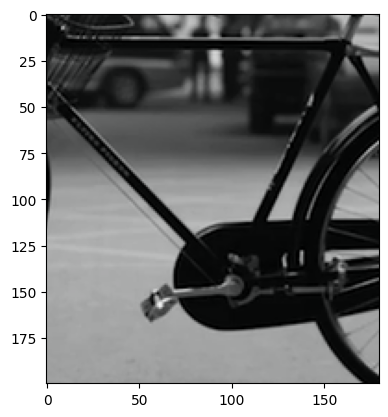

In [43]:
plt.imshow(b)
plt.imshow(d)

In [44]:
print(d.shape)

(200, 180, 3)


In [45]:
print(b.shape)

(361, 552, 3)


In [46]:
d_resized = cv2.resize(d, (b.shape[1], b.shape[0]))
b_resized = cv2.resize(b, (d.shape[1], d.shape[0]))
print(d_resized.shape)

db = d_resized+b

(361, 552, 3)


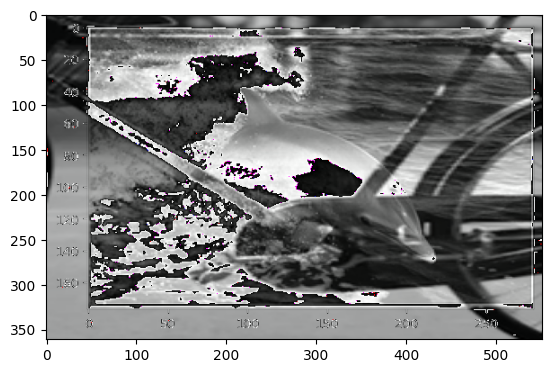

In [47]:
plt.imshow(db)

**Average**

In [48]:
avergae = (d_resized+b)/2

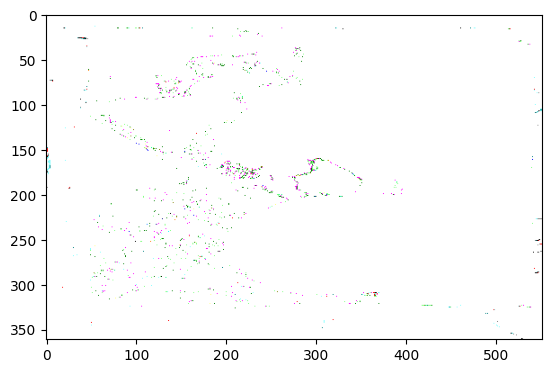

In [49]:
plt.imshow(avergae)

In [50]:
# Average the two images
averaged_image = cv2.addWeighted(d_resized, 0.5, b, 0.5, 0)

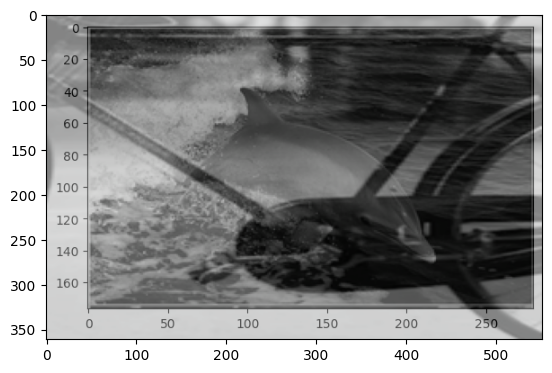

In [51]:
plt.imshow(averaged_image)
# cv2.waitKey(0)

uint8


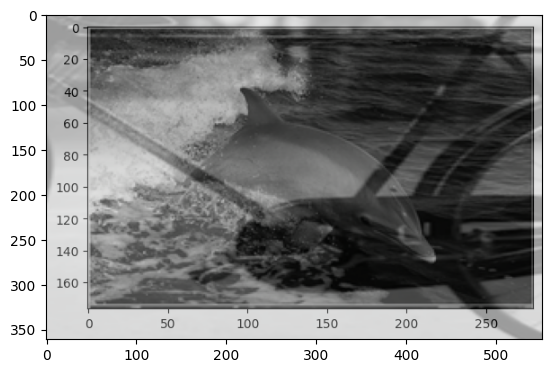

In [52]:
# Blending ( aka Alpha Blending is a weighted addition)
def myblend(imA,imB,alpha):
    rval = (alpha*imA)+((1-alpha)*imB)
    return rval

#x = myblend(b,d,0.999)
x = cv2.addWeighted(b,0.6,d_resized,0.4,0)
print(x.dtype)
plt.imshow(x)

## **Multiply by a scaler**

In [53]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [54]:
b = cv2.imread('/content/drive/MyDrive/Computer Vision/dolphin.png')

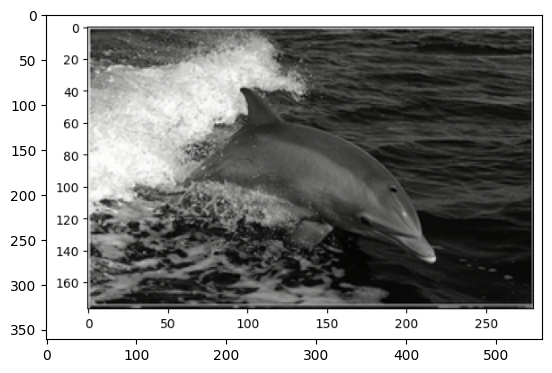

In [55]:
plt.imshow(b)

In [56]:
scalar = 3.5

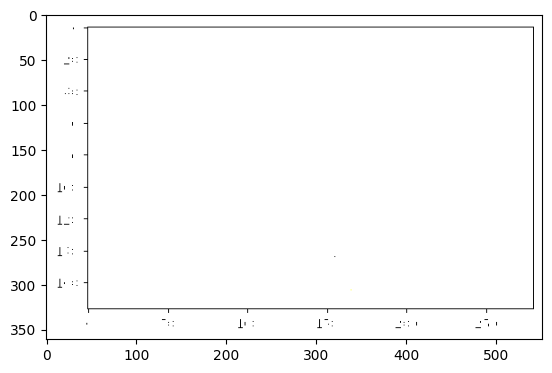

In [57]:
# Multiply the image by the scalar.
new_image = b * scalar
plt.imshow(new_image)

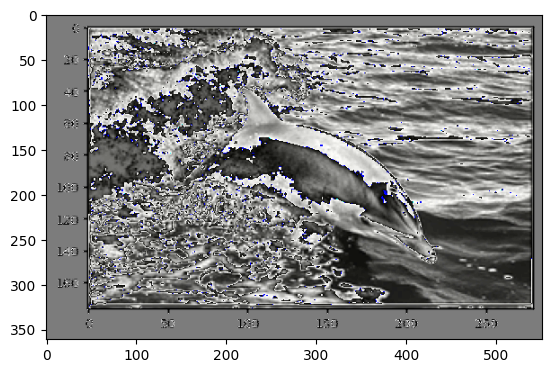

In [58]:
# Convert the new image to uint8 format.
new_image = new_image.astype('uint8')
plt.imshow(new_image)

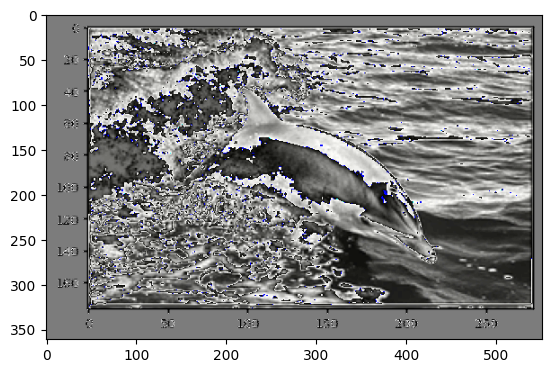

In [59]:
# Display the new image.
plt.imshow(new_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

## **Blend 2 Images**

In [60]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [61]:
d = cv2.imread('/content/drive/MyDrive/Computer Vision/bicycle.png')
b = cv2.imread('/content/drive/MyDrive/Computer Vision/dolphin.png')

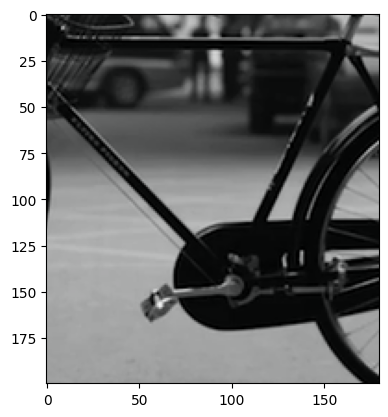

In [62]:
plt.imshow(d)

In [63]:
d_resized = cv2.resize(d, (b.shape[1], b.shape[0]))
b_resized = cv2.resize(b, (d.shape[1], d.shape[0]))
print(d_resized.shape)

(361, 552, 3)


In [64]:
result =0.85*b+0.15*d_resized

In [65]:
result = result.astype('uint8')

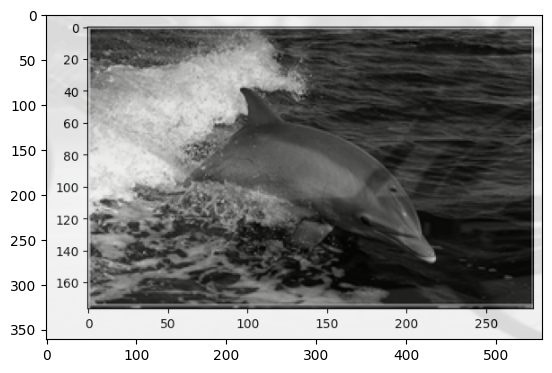

In [66]:
plt.imshow(result)

## **Common Types of Noise**

(361, 552, 3)
(361, 552, 3)
(361, 552, 3)


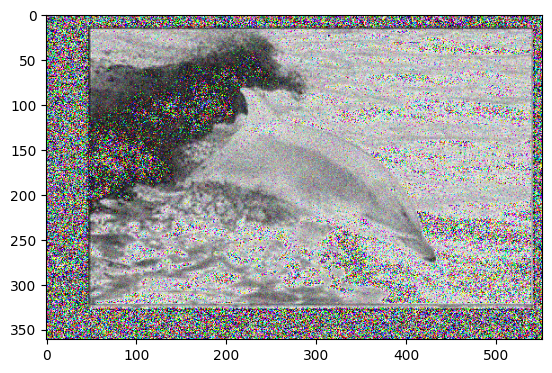

In [67]:
# Let's add some noise using python only
# Unfortunately python has no purpose built functions like matlab
# So we will build our own
from matplotlib import pyplot as plt
import cv2
import numpy as np

sigma = 6
d = cv2.imread('/content/drive/MyDrive/Computer Vision/dolphin.png')
plt.imshow(d)

print(d.shape)
row,col,ch= d.shape

var = 0.01
sigma = var**0.5      # sigma value affects the image. High value of sigma adds more noise.

gauss = np.random.normal(0,sigma,(row,col,ch)) # generates Gaussian noise with mean 0 and standard deviation sigma, having the same shape as the image d.
print(gauss.shape)


gauss = gauss.reshape(row,col,ch)
print(gauss.shape)
noisy = d + gauss

plt.imshow((noisy * 255).astype(np.uint8))


## **Image Difference Demo**

-1

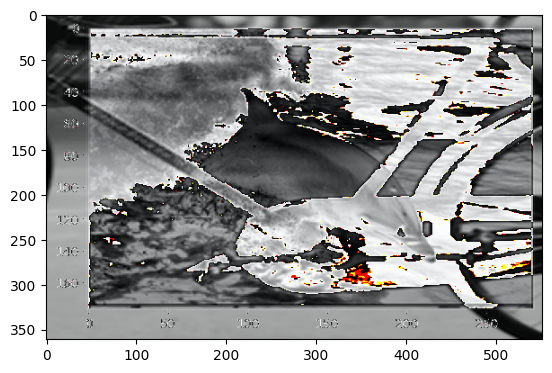

In [68]:
import cv2
from matplotlib import pyplot as plt

# Read the two images
image1 = cv2.imread('/content/drive/MyDrive/Computer Vision/bicycle.png')
image2 = cv2.imread('/content/drive/MyDrive/Computer Vision/dolphin.png')

# print(image1.shape)
# print(image2.shape)

image1_resized = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
# print(image1_resized.shape)

image1=image1_resized
image2=image2


# Calculate the difference between the two images
diff_color = cv2.absdiff(image1, image2)
# print(diff_color)

# # Calculate the difference between the two images
diff_color1 = (image1- image2)

# # Calculate the difference between the two images
diff_color2 = (image2- image1)

# print(diff_color1)
# print(diff_color2)

# # Convert the images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# # Calculate the difference between the two images
diff_gray = cv2.absdiff(gray1, gray2)

# # Threshold the difference image
threshold = 100
diff_binary = cv2.threshold(diff_gray, threshold, 255, cv2.THRESH_BINARY)[1]
# print(diff_binary)

# Display the difference image
#  plt.imshow(d)
# plt.imshow(diff_color2)
plt.imshow(diff_color1)

#cv2.imshow('Difference Image', diff_binary)
cv2.waitKey(0)

## **Generate Gaussian Noise**

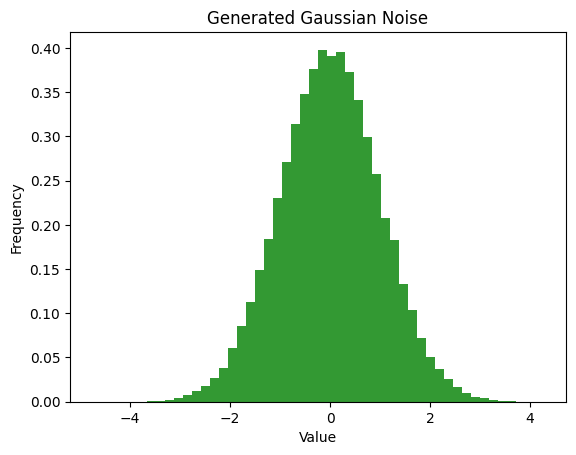

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Set the mean and standard deviation of the Gaussian distribution
mean = 0
std_dev = 1

# Set the number of samples
num_samples = 100000
# num_samples = 100

# Generate Gaussian noise
gaussian_noise = np.random.normal(mean, std_dev, num_samples)

# Plot the histogram of the generated Gaussian noise
plt.hist(gaussian_noise, bins=50, density=True, alpha=0.8, color='g')
plt.title('Generated Gaussian Noise')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

## **Apply Gaussian Noise**

In [70]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [71]:
import numpy as np
import matplotlib.pyplot as plt
import cv2  # Assuming you want to use OpenCV for image display

# Load your image using OpenCV or any other library
img = cv2.imread('/content/drive/MyDrive/Computer Vision/bicycle.png', cv2.IMREAD_COLOR)

# Generate Gaussian noise with the same size as the image
noise = np.random.randn(*img.shape) * 10
noise1 = np.random.randn(*img.shape) * 30
noise2 = np.random.randn(*img.shape) * 50              # values 10,30,50 makes image different

# Add the noise to the image
output = img + noise
output1 = img + noise1
output2 = img + noise2
# print(output)



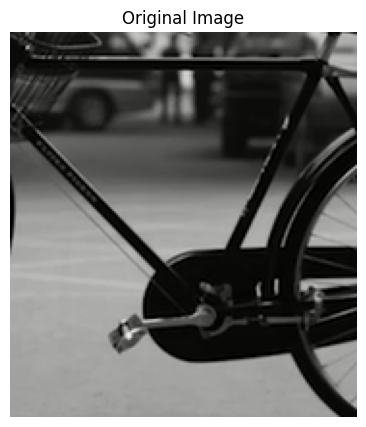

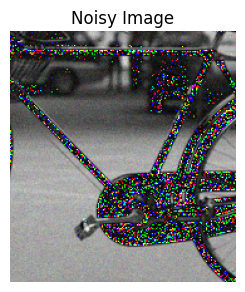

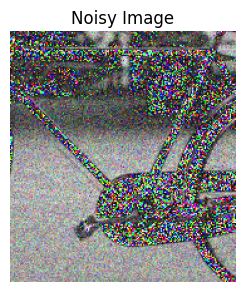

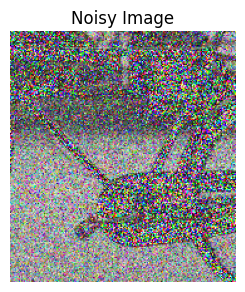

In [72]:
# Display the original and noisy images using matplotlib
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

plt.subplot(1, 2, 2)
plt.title('Noisy Image')
plt.imshow(cv2.cvtColor(output.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

plt.subplot(1, 2, 2)
plt.title('Noisy Image')
plt.imshow(cv2.cvtColor(output1.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

plt.subplot(1, 2, 2)
plt.title('Noisy Image')
plt.imshow(cv2.cvtColor(output2.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## **Read image**

**Using OpenCV**

-1

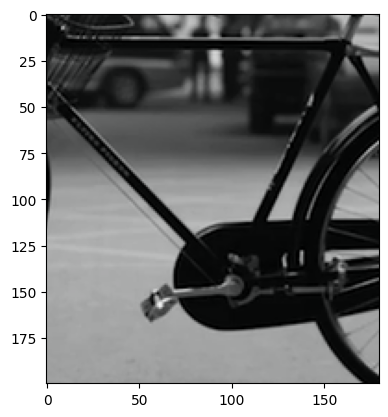

In [73]:

import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
# Read the image
img = cv2.imread("/content/drive/MyDrive/Computer Vision/bicycle.png")
# Display the image
#cv2_imshow("Image", img)
plt.imshow(img)
cv2.waitKey(0)

Extract only Red Channel

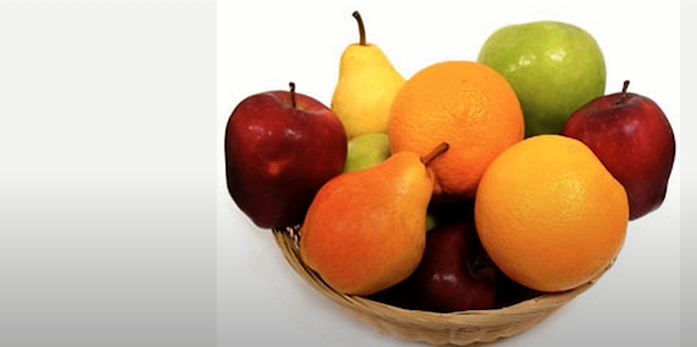

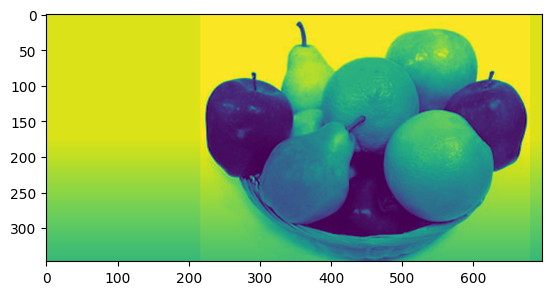

In [74]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
# Read the image
img = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")
# plt.imshow(img)

# Extract the red channel from the image
green_channel = img[:, :, 1]

upper_red = np.array([255, 255, 255])

# Display the image
cv2_imshow(img)
plt.imshow(green_channel)

cv2.waitKey(0)
cv2.destroyAllWindows()

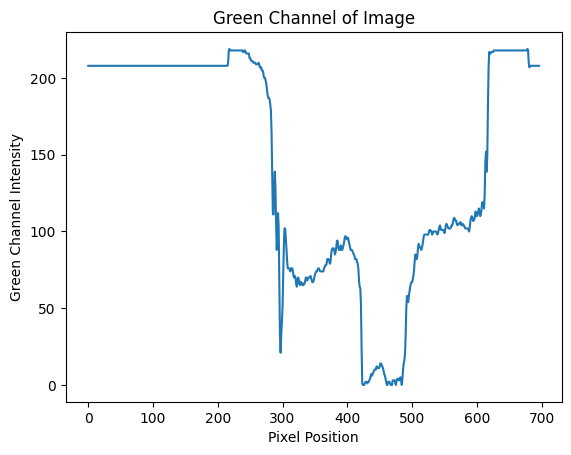

In [75]:

import matplotlib.pyplot as plt
import numpy as np

# Read the image
image = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")

# Extract the green channel from the image
green_channel = image[:, :, 1]

# Plot the green channel of the image
plt.plot(green_channel[256, :])
plt.xlabel("Pixel Position")
plt.ylabel("Green Channel Intensity")
plt.title("Green Channel of Image")
plt.show()

**Using Pillow**

In [76]:
from PIL import Image
# Open the image
img = Image.open("/content/drive/MyDrive/Computer Vision/bicycle.png")
# Display the image
img.show()

## **Image Size and Data Type**

In [77]:
from PIL import Image

image = Image.open("/content/drive/MyDrive/Computer Vision/bicycle.png")
size = image.size

In [78]:
# import numpy as np
# image = Image.open("/content/drive/MyDrive/Computer Vision/bicycle.png")
# size = image.shape

In [79]:
size

(180, 200)

In [80]:
import numpy as np

image = np.array(Image.open("/content/drive/MyDrive/Computer Vision/bicycle.png"))
dtype = image.dtype

In [81]:
dtype

dtype('uint8')

## **Crop an Image**

**Pillow**

In [82]:
from PIL import Image
from matplotlib import pyplot as plt

img = Image.open('/content/drive/MyDrive/Computer Vision/bicycle.png')

print(image.size)

108000


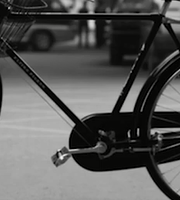

In [83]:

from IPython.display import display

# Display the image.
display(img)

In [84]:
# Crop the image to a square of 500x500 pixels at the center of the image.
box = (100, 100, 280, 280)
cropped_img = img.crop(box)
# display(cropped_img)


In [85]:
print(cropped_img.size)

(180, 180)


In [86]:
from PIL import Image
cropped_img.show()

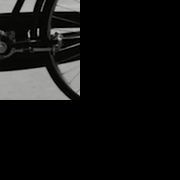

In [87]:
display(cropped_img)

**OpenCV**

In [88]:
!pip install opencv-contrib-python

In [89]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/drive/MyDrive/Computer Vision/bicycle.png')

# Crop the image to a square of 500x500 pixels at the center of the image.
box = (100, 100, 280, 280)
#cropped_img = cv2.imcrop(img, box)
cropped_img = img[100:100, 280:280]


display(cropped_img)


array([], shape=(0, 0, 3), dtype=uint8)

# **Chapter 3:— Filters**


**Table of Content**

1. Moving Average in 2D
1. What are Filters?
2. What is sobel filter?
3. How to create and apply sobel filter?
4. What is the Laplacian filter?
5. How to create and apply the Laplacian filter?

## **3.1-Imports**

In [90]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

In [91]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Moving Average In 2D**

In [92]:
import cv2
import numpy as np

The moving_average_2d function applies a moving average (or box blur) filter to a 2D image using a kernel of the specified size.

In [93]:
def moving_average_2d(image, kernel_size):
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
    result = cv2.filter2D(image, -1, kernel)
    return result


In [94]:
# Example usage
image_path = '/content/drive/MyDrive/Computer Vision/fruit.png'  # Replace with the path to your image
original_image = cv2.imread(image_path)


In [95]:
from IPython.display import display

'Original Image'

array([[[244, 245, 245],
        [243, 244, 244],
        [243, 244, 244],
        ...,
        [243, 244, 244],
        [243, 244, 244],
        [243, 244, 244]],

       [[241, 242, 242],
        [242, 243, 243],
        [242, 243, 243],
        ...,
        [241, 242, 242],
        [241, 242, 242],
        [241, 242, 242]],

       [[241, 242, 242],
        [241, 242, 242],
        [241, 242, 242],
        ...,
        [241, 242, 242],
        [241, 242, 242],
        [241, 242, 242]],

       ...,

       [[172, 173, 173],
        [172, 173, 173],
        [172, 173, 173],
        ...,
        [172, 173, 173],
        [172, 173, 173],
        [172, 173, 173]],

       [[171, 172, 172],
        [171, 172, 172],
        [171, 172, 172],
        ...,
        [171, 172, 172],
        [171, 172, 172],
        [171, 172, 172]],

       [[171, 172, 172],
        [171, 172, 172],
        [171, 172, 172],
        ...,
        [171, 172, 172],
        [171, 172, 172],
        [171, 172, 172]]], dtype=uint8)
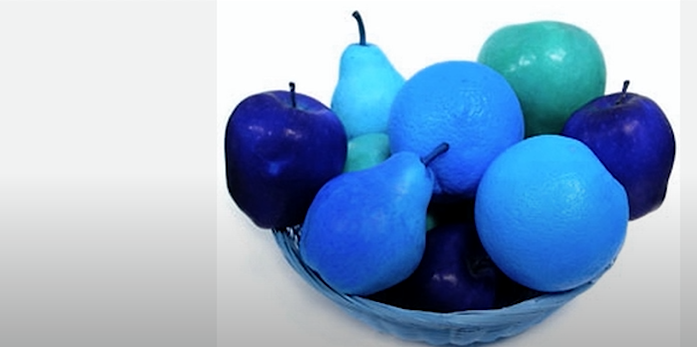

'Smoothed Image'

array([[[242, 243, 243],
        [242, 243, 243],
        [242, 243, 243],
        ...,
        [241, 242, 242],
        [241, 242, 242],
        [241, 242, 242]],

       [[242, 243, 243],
        [242, 243, 243],
        [242, 243, 243],
        ...,
        [241, 242, 242],
        [241, 242, 242],
        [241, 242, 242]],

       [[242, 243, 243],
        [242, 243, 243],
        [242, 243, 243],
        ...,
        [241, 242, 242],
        [241, 242, 242],
        [241, 242, 242]],

       ...,

       [[172, 173, 173],
        [172, 173, 173],
        [172, 173, 173],
        ...,
        [172, 173, 173],
        [172, 173, 173],
        [172, 173, 173]],

       [[171, 172, 172],
        [171, 172, 172],
        [171, 172, 172],
        ...,
        [171, 172, 172],
        [171, 172, 172],
        [171, 172, 172]],

       [[171, 172, 172],
        [171, 172, 172],
        [171, 172, 172],
        ...,
        [171, 172, 172],
        [171, 172, 172],
        [171, 172, 172]]], dtype=uint8)
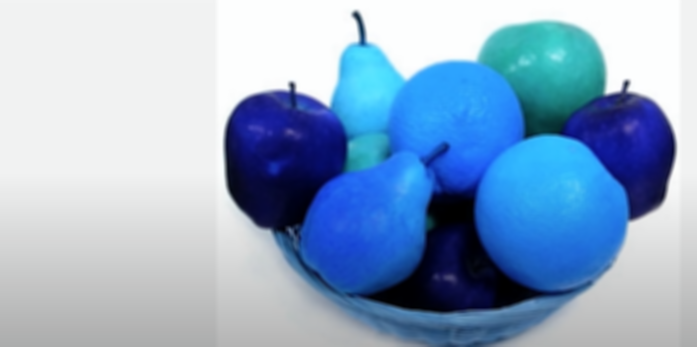

In [96]:
if original_image is not None:
    # Choose a kernel size for the moving average
    kernel_size = 5

    # Apply the moving average
    smoothed_image = moving_average_2d(original_image, kernel_size)

    # Display the original and smoothed images
    display('Original Image', original_image)
    display('Smoothed Image', smoothed_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
else:
    print("Error: Unable to read the image.")

## **3.2. Load the images in the format you want**

In [97]:
image3 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/Computer Vision/fruit.png'),cv2.COLOR_BGR2RGB)


## **3.3-Plot the image**

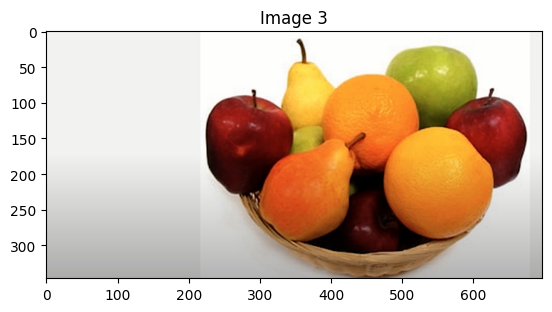

In [98]:
plt.imshow(image3)
plt.title('Image 3')
plt.show()

## **3.4-Convert our image to grayScale**

In [116]:
def to_gray(image):
    return cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

## **Averaging Filter**

In [100]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [101]:
original_image = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")

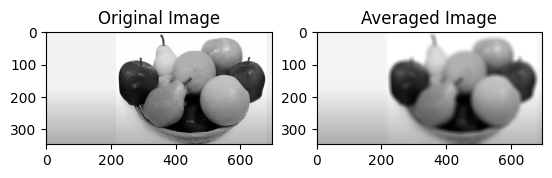

In [102]:
# Convert the image to grayscale (optional, depending on your use case)
original_image = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)  # convert image to grayscale

# Apply the Averaging Filter
kernel_size = (15, 15) # Adjust the kernel size as needed (used for amount of smoothing 15 X 15)
averaging_filter = np.ones(kernel_size, np.float32) / (kernel_size[0] * kernel_size[1]) # matrix that ensures sum of all elements in filter is 1 # intensity of image
averaged_image = cv2.filter2D(gray_image, -1, averaging_filter)

# Display the original and averaged images
plt.subplot(121), plt.imshow(gray_image, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(averaged_image, cmap='gray'), plt.title('Averaged Image')
plt.show()

## **Gaussian Filter**

In [103]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [104]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [105]:
original_image = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")

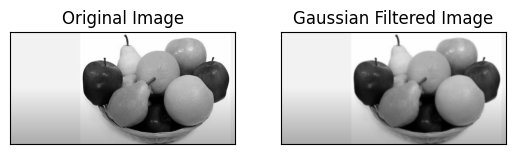

In [106]:

# Load an image
#image_path = "path_to_your_image.jpg"
#original_image = cv2.imread(image_path)
# Convert the image to grayscale (if it's a color image)
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian filter
kernel_size = (5, 5) # Adjust the kernel size based on your requirements
sigma = 1.5 # Adjust the sigma value based on your requirements

filtered_image = cv2.GaussianBlur(gray_image, kernel_size, sigma)

# Display the original and filtered images side by side
plt.subplot(1, 2, 1), plt.imshow(gray_image, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(filtered_image, cmap='gray')
plt.title('Gaussian Filtered Image'), plt.xticks([]), plt.yticks([])
plt.show()

### **Noise removal through Gaussian Filter**

In [107]:
import cv2
import numpy as np
# Load an image
img = cv2.imread("/content/drive/MyDrive/Computer Vision/fruit.png")

In [108]:
# Add some noise
# noise_sigma = 105
noise_sigma = 50
noise = np.random.randn(*img.shape) * noise_sigma
noisy_img = np.clip(img + noise, 0, 255).astype(np.uint8)

**Show orginal Image**

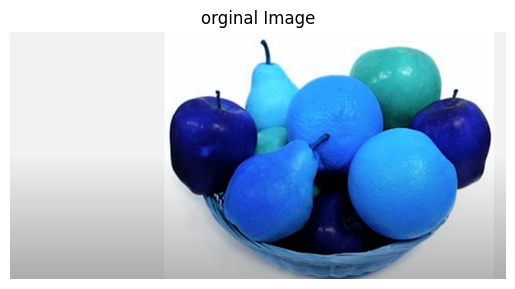

In [109]:
import matplotlib.pyplot as plt

# Display noisy image
plt.imshow(img)
plt.title('orginal Image')
plt.axis('off')  # Turn off axis
plt.show()

**show Nosy image and revove noise to smooth the image**

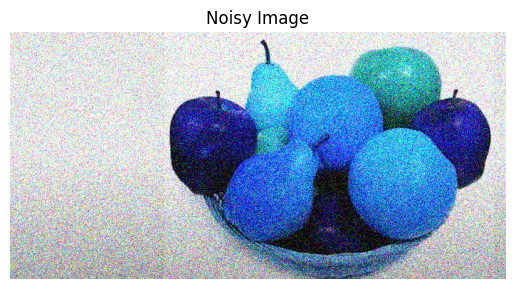

In [110]:
import matplotlib.pyplot as plt

# Display noisy image
plt.imshow(noisy_img)
plt.title('Noisy Image')
plt.axis('off')  # Turn off axis
plt.show()

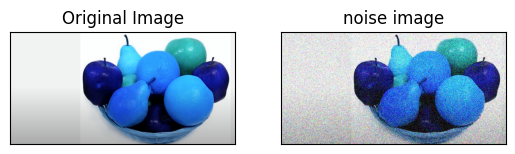

In [111]:
# Display noisy image
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1), plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(noisy_img)
plt.title('noise image'), plt.xticks([]), plt.yticks([])
plt.show()

In [112]:

# Create a Gaussian Filter
filter_size = 11 # filter_size: The size of the filter. This determines the dimensions of the Gaussian kernel.
filter_sigma = 2 # filter_sigma: The standard deviation of the Gaussian distribution. This determines the amount of blurring.

# filter_size = 22
# filter_sigma = 4

filter = cv2.getGaussianKernel(filter_size, filter_sigma)          # Creates a 1D Gaussian kernel
filter = filter * filter.T         # Converts the 1D kernel into a 2D Gaussian kernel by multiplying it with its transpose.



In [113]:
# Apply it to remove noise
smoothed = cv2.filter2D(noisy_img, -1, filter)  # Applies the Gaussian filter to the noisy image. The -1 parameter means the output image will have the same depth as the input image.


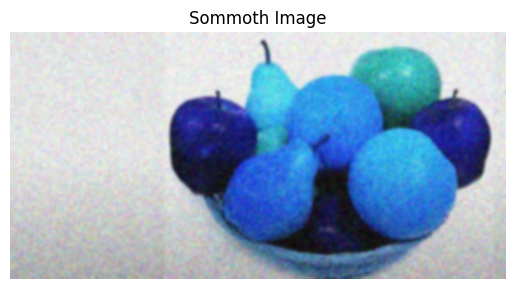

In [114]:
import matplotlib.pyplot as plt

# Display noisy image
plt.imshow(smoothed)
plt.title('Sommoth Image')
plt.axis('off')  # Turn off axis
plt.show()

## **3.5-Sobel Filter**

**Sobel Filter — Used to detect verticle edges**

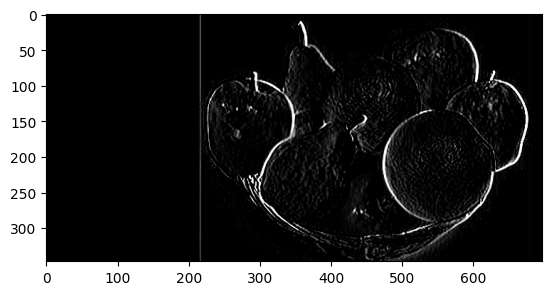

In [117]:
sobel_x = np.array([[-1,0,1],
                  [-5,0,5],
                  [-1,0,1]])

filtered_x = cv2.filter2D(to_gray(image3),-1,sobel_x)

#represents that 'do not change the format of output image and keep it same as input image'
plt.imshow(filtered_x,cmap='gray')

Let's see how the change in threshold value changes the output

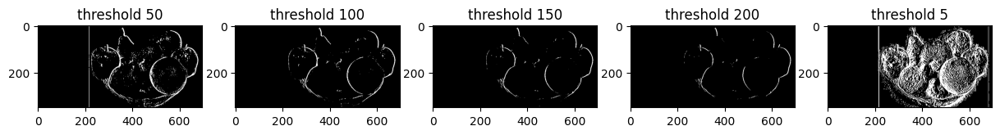

In [118]:
#  Set a threshold, so that points above threshold will be white/visible
retval, binary_image1 = cv2.threshold(filtered_x,50,255,cv2.THRESH_BINARY)
retval, binary_image2 = cv2.threshold(filtered_x,100,255,cv2.THRESH_BINARY)
retval, binary_image3 = cv2.threshold(filtered_x,150,255,cv2.THRESH_BINARY)
retval, binary_image4 = cv2.threshold(filtered_x,200,255,cv2.THRESH_BINARY)
retval, binary_image5 = cv2.threshold(filtered_x,5,255,cv2.THRESH_BINARY)

fig,(ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(15,8))
ax1.set_title('threshold 50')
ax1.imshow(binary_image1,cmap='gray')
ax2.set_title('threshold 100')
ax2.imshow(binary_image2,cmap='gray')
ax3.set_title('threshold 150')
ax3.imshow(binary_image3,cmap='gray')
ax4.set_title('threshold 200')
ax4.imshow(binary_image4,cmap='gray')
ax5.set_title('threshold 5')
ax5.imshow(binary_image5,cmap='gray')

**Sobel Filter — Used to detect horizontal edges**


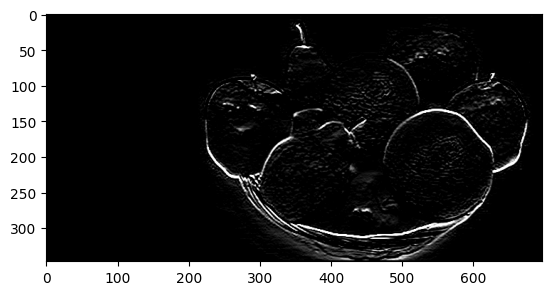

In [119]:
sobel_y = np.array([[-1,-5,-1],
                   [0,0,0],
                   [1,5,1]])
filtered_y = cv2.filter2D(to_gray(image3),-1,sobel_y)
plt.imshow(filtered_y,cmap='gray')

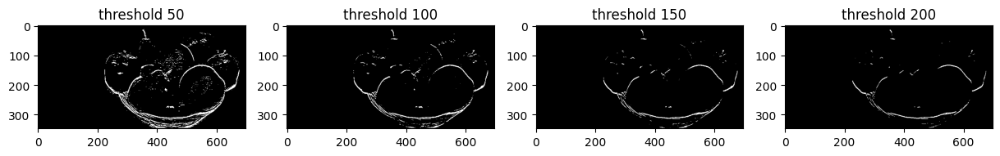

In [120]:
#  Set a threshold, so that points above threshold will be white/visible
retval, binary_image1 = cv2.threshold(filtered_y,50,255,cv2.THRESH_BINARY)
retval, binary_image2 = cv2.threshold(filtered_y,100,255,cv2.THRESH_BINARY)
retval, binary_image3 = cv2.threshold(filtered_y,150,255,cv2.THRESH_BINARY)
retval, binary_image4 = cv2.threshold(filtered_y,200,255,cv2.THRESH_BINARY)

fig,(ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(15,8))
ax1.set_title('threshold 50')
ax1.imshow(binary_image1,cmap='gray')
ax2.set_title('threshold 100')
ax2.imshow(binary_image2,cmap='gray')
ax3.set_title('threshold 150')
ax3.imshow(binary_image3,cmap='gray')
ax4.set_title('threshold 200')
ax4.imshow(binary_image4,cmap='gray')

## **3.6-Laplacian Filter**

In [121]:
kernel_size = 3
def lap_filter(k):
    laplacian_filter = np.array([[1, 1, 1],
                                 [1, -k, 1],
                                 [1, 1, 1]])
    laplacian_filter = laplacian_filter / np.sum(np.abs(laplacian_filter))
    return laplacian_filter

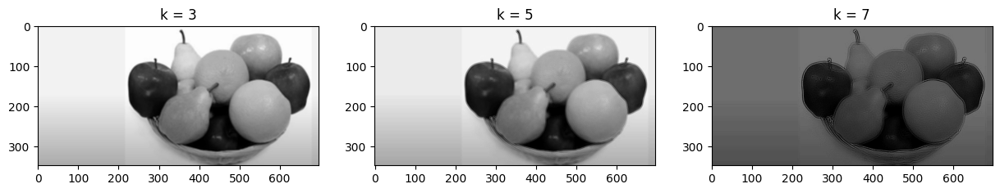

In [122]:
# Apply Laplacian filter

img = cv2.imread('/content/drive/MyDrive/Computer Vision/fruit.png', cv2.IMREAD_GRAYSCALE)

filtered_3 = cv2.filter2D(img, -1, lap_filter(3))
filtered_5 = cv2.filter2D(img, -1, lap_filter(5))
filtered_7 = cv2.filter2D(img, -1, lap_filter(7))

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,8))
ax1.set_title('k = 3')
ax1.imshow(filtered_3,cmap='gray')
ax2.set_title('k = 5')
ax2.imshow(filtered_5,cmap='gray')
ax3.set_title('k = 7')
ax3.imshow(filtered_7,cmap='gray')

# **Chapter 3 Image Recognition**

## **3.1-Convolutional Neural Networks**

# New Section

**Import librariy**

In [123]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
#Libraries for implementing a CNN
from keras.layers import Conv2D, Flatten, MaxPooling2D, Dense, Dropout
from keras.models import Sequential
from keras.utils import to_categorical

In [124]:
import tensorflow as tf
import numpy as np

**loading the dataset**

In [125]:
# train = pd.read_csv('/content/drive/MyDrive/Courses /Data Science /Computer Vision /Dataset/Sign Language MNIST Dataset/sign_mnist_test.csv')
# test = pd.read_csv('/content/drive/MyDrive/Courses /Data Science /Computer Vision /Dataset/Sign Language MNIST Dataset/sign_mnist_train.csv')

In [150]:
# Download the dataset
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data() # loads the MNIST dataset, which consists of 28x28 grayscale images
#of handwritten digits and their labels.

# Save the dataset to disk as .npz file
np.savez('mnist_train.npz', images=train_images, labels=train_labels)
np.savez('mnist_test.npz', images=test_images, labels=test_labels)

print("MNIST dataset saved successfully.")

MNIST dataset saved successfully.


In [151]:
train_images.shape

(60000, 28, 28)

In [152]:
test_images.shape

(10000, 28, 28)

In [153]:
train_labels.shape
test_labels.shape

(10000,)

Now, we need to represent the data in such a way that it can represent the image. Note that the raw data has all pixel values stored as an array. It needs to be converted into a 28*28 matrix in this case. The ‘label’ column in the dataset gives us the information about what alphabet the image represents. Some input images are visualized below.

In [130]:
# labels = train.pop('label')  #Pops the label column and stores in 'labels'
# labels = to_categorical(labels)
# train = train.values
# train = np.array([np.reshape(i, (28,28)) for i in train])
# train = train / 255

**Training and validation datasetsets**

In [154]:
X_train, X_val, y_train, y_val = train_test_split(train_images, train_labels, test_size=0.3, random_state=41)
print("X_train--{}  X_val--{} y_train--{}  y_val--{} ".format(X_train.shape,X_val.shape,y_train.shape,y_val.shape))


X_train--(42000, 28, 28)  X_val--(18000, 28, 28) y_train--(42000,)  y_val--(18000,) 


In [155]:
print("X_train--{}  X_val--{} y_train--{}  y_val--{} ".format(X_train.shape,X_val.shape,y_train.shape,y_val.shape))

X_train--(42000, 28, 28)  X_val--(18000, 28, 28) y_train--(42000,)  y_val--(18000,) 


X_train--(42000, 28, 28, 1)

42000: The number of training samples.
28, 28: The dimensions of each image (28x28 pixels).
1: The number of channels (since the images are grayscale, there is only one channel).

X_val--(18000, 28, 28, 1)

18000: The number of validation samples.
28, 28: The dimensions of each image (28x28 pixels).
1: The number of channels (grayscale).


y_train--(42000, 10)

42000: The number of training samples.
10: The number of classes in the one-hot encoded labels (digits 0 through 9).


y_val--(18000, 10)

18000: The number of validation samples.
10: The number of classes in the one-hot encoded labels (digits 0 through 9).


In [156]:
#Reshaping the training and validation sets # converts images to have a shape of (28, 28, 1),
# where 1 represents the single color channel (grayscale)

X_train = X_train.reshape(X_train.shape[0], 28,28,1)
X_val = X_val.reshape(X_val.shape[0], 28,28,1)

In [157]:
X_train.shape
X_val.shape

(18000, 28, 28, 1)

In [158]:
# One-hot encode the labels # converts the integer labels into one-hot encoded vectors. For MNIST, this means converting
#each label into a vector of length 10, where the index corresponding to the digit is set to 1, and all others are 0

y_train = to_categorical(y_train, num_classes=10)
y_val = to_categorical(y_val, num_classes=10)

In [159]:
print("X_train-{}  X_val-{} y-train-{} y-val-{}".format(X_train.shape,X_val.shape,y_train.shape,y_val.shape))

X_train-(42000, 28, 28, 1)  X_val-(18000, 28, 28, 1) y-train-(42000, 10) y-val-(18000, 10)


**Building Our CNN**

**Convolutional Layer **1

Conv2D(8, (3,3), input_shape=(28,28,1), activation='relu')
Purpose: This layer applies 8 convolutional filters of size 3x3 to the input image.
Significance:
Filters: Detects features such as edges and textures from the input image.
Input Shape: (28,28,1) indicates the input is a 28x28 grayscale image (1 channel).
Activation ('relu'): Adds non-linearity to the model, enabling it to learn more complex patterns.

**Max Pooling Layer 1**

MaxPooling2D(pool_size=(2,2), strides=2)
Purpose: Reduces the spatial dimensions of the feature maps.
Significance:
Pool Size: (2,2) indicates a 2x2 window for pooling.
Strides: 2 means the window moves by 2 pixels at a time.
Effect: This layer reduces the size of the feature maps by half, thereby reducing the computational load and helping to achieve spatial invariance.


**Convolutional Layer 2**

Conv2D(16, (3,3), activation='relu')
Purpose: Applies 16 convolutional filters of size 3x3 to the pooled feature maps from the previous layer.
Significance:
Filters: Learns more complex features and patterns in the data.
Activation ('relu'): Introduces non-linearity.


**Max Pooling Layer 2**

MaxPooling2D(pool_size=(2,2), strides=2)
Purpose: Further reduces the spatial dimensions of the feature maps.
Significance:
Pool Size: (2,2)
Strides: 2
Effect: Further reduces the size of the feature maps, providing more spatial invariance and reducing the number of parameters.


**Flatten Layer**

Flatten()
Purpose: Converts the 2D feature maps into a 1D vector.
Significance:
Effect: Prepares the data for the fully connected layers by flattening the spatial structure.


**Fully Connected (Dense) Layer 1**

Dense(128, activation='relu')
Purpose: Adds a dense layer with 128 neurons.
Significance:
Neurons: Each neuron is fully connected to all neurons in the previous layer.
Activation ('relu'): Enables the network to learn complex representations.

**Dropout Layer**

Dropout(0.4)
Purpose: Regularizes the model by randomly dropping 40% of the neurons during training.
Significance:
Dropout Rate: 0.4 means 40% of the neurons are dropped.
Effect: Helps prevent overfitting by ensuring the network doesn't rely too much on any individual neurons.


**Fully Connected (Dense) Layer 2**

Dense(10, activation='softmax')
Purpose: The output layer with 10 neurons, one for each class (digit 0-9).
Significance:
Neurons: Each neuron corresponds to a digit class.
Activation ('softmax'): Converts the output to a probability distribution over the 10 classes.

Notice that the Dropout set to 0.4 at the end. You can tweak that value as well. At the backend, it essentially reduces overfitting, i.e the phenomenon when the model performs really well on the training data but miserably fails with the test data.

In [136]:
model = Sequential()
#input_shape’ parameter, you will have to use the dimensions of your input image.
#Make a note of ‘relu’ and ‘softmax’, both of which are the activation functions.
model.add(Conv2D(8, (3,3), input_shape=(28,28,1), activation='relu'))   # Conv2D layer has 8 filters of size 3 X 3 , applied to input image # detects edges/textures of image
model.add(MaxPooling2D(pool_size=(2,2), strides=2))
model.add(Conv2D(16, (3,3), activation='relu'))                          # Conv2D layer has 16 filters of size 3 X 3
model.add(MaxPooling2D(pool_size=(2,2), strides=2))   # maxpooling layer
model.add(Flatten())                             # converts 2D matrix into 1D vector
model.add(Dense(128, activation='relu'))         # fully connected layer with 128 neurons
model.add(Dropout(0.4))                             # dropd 40% of neurons during training to prevent overfitting
# ‘Dense’ bracket. 25 here signifies the number of outcomes (or the number of classes) for my dataset. It may vary depending on the shape of your dataset.
model.add(Dense(10, activation='softmax')) # A final dense layer with 10 neurons (one for each digit) and softmax activation to output class probabilities.
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 26, 26, 8)           │              80 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 13, 13, 8)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 11, 11, 16)          │           1,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 5, 5, 16)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 400)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          51,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 53,866 (210.41 KB)

 Trainable params: 53,866 (210.41 KB)

 Non-trainable params: 0 (0.00 B)

**Train your model**

In [137]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#Code for Training our Model
history = model.fit(X_train, y_train, validation_data = (X_val, y_val), epochs=50, batch_size=512)

Epoch 1/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - accuracy: 0.4093 - loss: 7.0655 - val_accuracy: 0.8548 - val_loss: 0.4769
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - accuracy: 0.7853 - loss: 0.6787 - val_accuracy: 0.9209 - val_loss: 0.2663
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - accuracy: 0.8687 - loss: 0.4301 - val_accuracy: 0.9439 - val_loss: 0.1929
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - accuracy: 0.9039 - loss: 0.3122 - val_accuracy: 0.9546 - val_loss: 0.1587
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - accuracy: 0.9226 - loss: 0.2575 - val_accuracy: 0.9604 - val_loss: 0.1359
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - accuracy: 0.9283 - loss: 0.2322 - val_accuracy: 0.9646 - val_loss: 0.1240
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - accuracy: 0.9392 - loss: 0.2030 - val_accuracy: 0.9675 - val_loss: 0.1114
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - accuracy: 0.9478 - loss: 0.1791 - val_accu

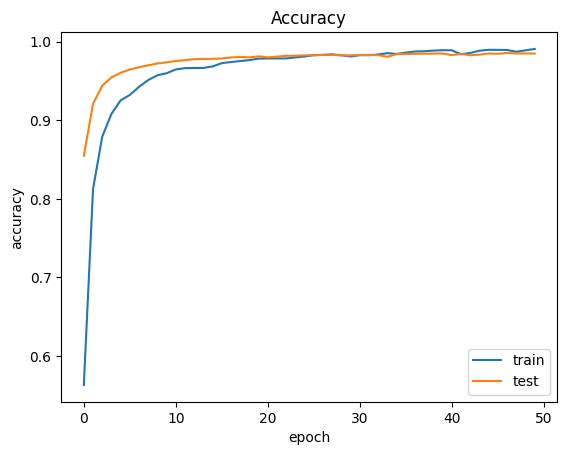

In [138]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title("Accuracy")
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train','test'])
plt.show()

Initially, the training accuracy is lower but increases steadily as the number of epochs increases.
After about 10 epochs, the training accuracy starts to plateau and gradually approaches 1.0 (or 100%), indicating the model is learning the training data well.

Initially, the test accuracy is also lower but increases rapidly.
It peaks early, around 10 epochs, and then slightly fluctuates but remains relatively high and stable around 0.98-0.99 (or 98-99%).

**Model performs on the test dataset.**

In [172]:
test_images.shape
test_labels.shape


(10000,)

In [173]:
# y_test = test.pop('label')
y_test = to_categorical(test_labels)
y_test.shape

test_images
X_test = np.array([np.reshape(i, (28,28)) for i in test_images])
X_test.shape


(10000, 28, 28)

In [174]:
# X_test = X_test / 255
X_test = X_test.reshape(X_test.shape[0], 28,28,1)
X_test.shape

#Recognizing images on the test dataset
predictions = model.predict(X_test)
test_accuracy = accuracy_score(np.argmax(y_test, axis=1), np.argmax(predictions, axis=1))
print("The test accuracy is: ", test_accuracy)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
The test accuracy is:  0.9855


# **📚Chapter: 4-Linearity and Convolution**

## **Boundary Issues**

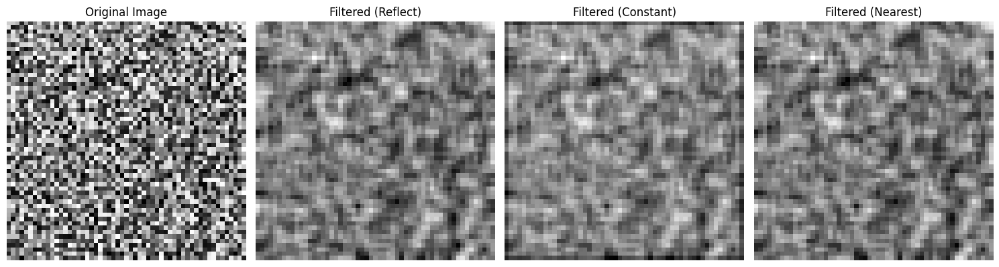

In [175]:
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt

# Create a sample 2D array (image)
image = np.random.random((55, 55))

# Define a filter kernel (e.g., Gaussian filter)
filter_kernel = np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
]) / 9.0  # Simple averaging filter

# Apply the filter with different boundary conditions
filtered_reflect = scipy.ndimage.convolve(image, filter_kernel, mode='reflect')
filtered_constant = scipy.ndimage.convolve(image, filter_kernel, mode='constant', cval=0.0)
filtered_nearest = scipy.ndimage.convolve(image, filter_kernel, mode='nearest')

# Plot the original and filtered images
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')

axes[1].imshow(filtered_reflect, cmap='gray')
axes[1].set_title('Filtered (Reflect)')

axes[2].imshow(filtered_constant, cmap='gray')
axes[2].set_title('Filtered (Constant)')

axes[3].imshow(filtered_nearest, cmap='gray')
axes[3].set_title('Filtered (Nearest)')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()


##**Explore Edge Options**

In [176]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [177]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


In [178]:
# Read an image
img = cv2.imread('/content/drive/MyDrive/Computer Vision/fruit.png')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert BGR to RGB for displaying correctly in matplotlib

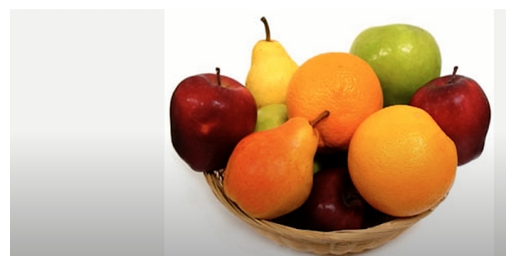

In [179]:
# Display the image
plt.imshow(img_rgb)
plt.axis('off') # Hide the axis
plt.show()

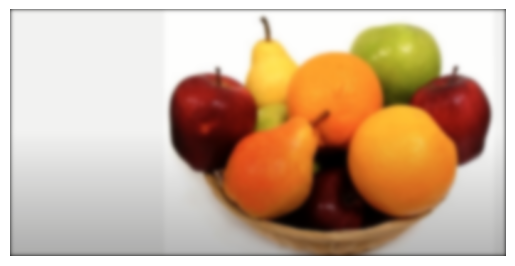

In [180]:
# Create a Gaussian filter
filter_size = 21
filter_sigma = 3
filt = cv2.getGaussianKernel(filter_size, filter_sigma)
filt = filt * filt.T # Convert to 2D Gaussian filter

# Apply it specifying a border type (equivalent to edge parameter in Matlab)
smoothed = cv2.filter2D(img, -1, filt, borderType=cv2.BORDER_CONSTANT)

# Display the smoothed image
smoothed_rgb = cv2.cvtColor(smoothed, cv2.COLOR_BGR2RGB) # Convert BGR to RGB for displaying correctly in matplotlib
plt.imshow(smoothed_rgb)
plt.axis('off') # Hide the axis
plt.show()


## **Practicing with Linear Filters**

In [181]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import the cv2_imshow function

In [182]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [183]:
# Read an image
img = cv2.imread('/content/drive/MyDrive/Computer Vision/fruit.png')
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert BGR to RGB for displaying correctly in matplotlib

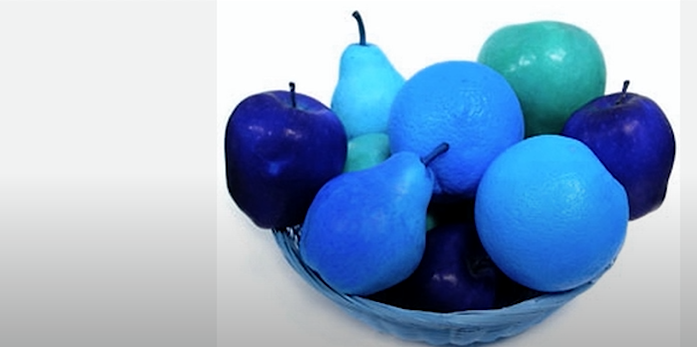

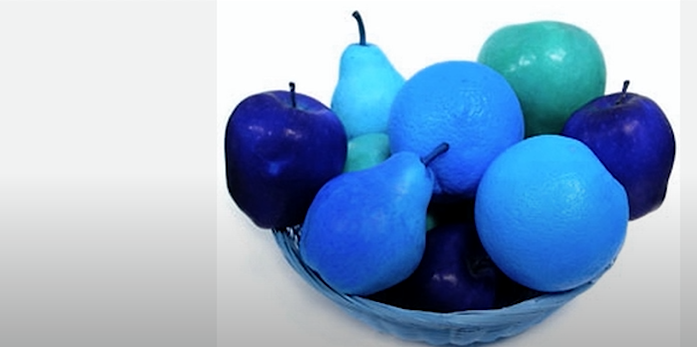

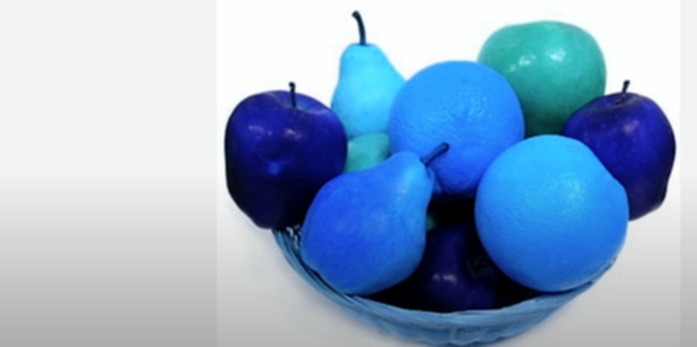

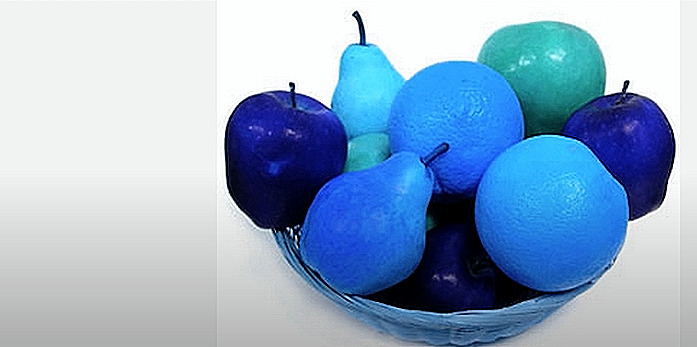

In [184]:


# Define filters
impulse_filter = np.array([[0, 0, 0],
                           [0, 1, 0],
                           [0, 0, 0]], dtype=np.float32)

blur_filter = np.ones((3, 3), dtype=np.float32) / 9.0

sharpen_filter = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]], dtype=np.float32)

# Apply filters using convolution
impulse_output = cv2.filter2D(image, -1, impulse_filter)
blur_output = cv2.filter2D(image, -1, blur_filter)
sharpen_output = cv2.filter2D(image, -1, sharpen_filter)

# Display results using cv2_imshow
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow
cv2_imshow(impulse_output)
cv2_imshow(blur_output)
cv2_imshow(sharpen_output)

cv2.waitKey(0)
cv2.destroyAllWindows()

# **References**

[1-Computer Vision Tutorial Series M1C1](https://pub.towardsai.net/computer-vision-tutorial-series-m1c1-535c27cd36ca)

[2-Module 1 — Image Representation and Classification](https://medium.com/towards-artificial-intelligence/computer-vision-tutorial-series-m1c2-13628dceab33)

[3-Computer Vision Tutorial Series M1C2](https://pub.towardsai.net/computer-vision-tutorial-series-m1c2-13628dceab33)

[4-Module 2 — Convolutional Filters and Edge Detection](https://pub.towardsai.net/computer-vision-tutorial-series-m2c2-62b8272eb45d)

[5-CS6476-Computer Vision](https://monzersaleh.github.io/GeorgiaTech/CS6476_CV/CS6476_ComputerVision.html)

[6-Applied Machine Learning: Part 2](https://medium.com/the-research-nest/applied-machine-learning-part-2-a4ba715649d1)